<a href="https://colab.research.google.com/github/cbharathulwar/bottomjet/blob/main/Bottom_Quark_Jet_Identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Enhanced Classification of Boosted Bottom Quarks Using Deep Learning Techniques**


---


[Reference Paper ](https://arxiv.org/pdf/2104.14659.pdf)

[Dataset](https://www.kaggle.com/datasets/fedesoriano/multijet-primary-dataset)


# Preproscessing

In [ ]:
 import pandas as pd
from google.colab import files
import io

# Upload the CSV file
uploaded = files.upload()

# Assuming there is only one CSV file uploaded, get the file's name and read it into a DataFrame
file_name = next(iter(uploaded))
data = pd.read_csv(io.BytesIO(uploaded[file_name]))

# Check the shape of the dataset
print("Shape of the dataset:", data.shape)

# Check the data types of the columns
print("\nData types of the columns:")
print(data.dtypes)

# Check for missing values
print("\nMissing values in each column:")
missing_values = data.isnull().sum()
print(missing_values)

# Check the percentage of missing values in each column
print("\nPercentage of missing values in each column:")
percent_missing = (missing_values / len(data)) * 100
print(percent_missing)

data.describe()


Saving MultiJetRun2010B.csv to MultiJetRun2010B.csv
Shape of the dataset: (21726, 17)

Data types of the columns:
Run         int64
Lumi        int64
Event       int64
MR        float64
Rsq       float64
E1        float64
Px1       float64
Py1       float64
Pz1       float64
E2        float64
Px2       float64
Py2       float64
Pz2       float64
HT        float64
MET       float64
nJets       int64
nBJets      int64
dtype: object

Missing values in each column:
Run       0
Lumi      0
Event     0
MR        0
Rsq       0
E1        0
Px1       0
Py1       0
Pz1       0
E2        0
Px2       0
Py2       0
Pz2       0
HT        0
MET       0
nJets     0
nBJets    0
dtype: int64

Percentage of missing values in each column:
Run       0.0
Lumi      0.0
Event     0.0
MR        0.0
Rsq       0.0
E1        0.0
Px1       0.0
Py1       0.0
Pz1       0.0
E2        0.0
Px2       0.0
Py2       0.0
Pz2       0.0
HT        0.0
MET       0.0
nJets     0.0
nBJets    0.0
dtype: float64


,Run,Lumi,Event,MR,Rsq,E1,Px1,Py1,Pz1,E2,Px2,Py2,Pz2,HT,MET,nJets,nBJets
count,21726.000000,21726.000000,2.172600e+04,21726.000000,21726.000000,21726.000000,21726.000000,21726.000000,21726.000000,21726.000000,21726.000000,21726.000000,21726.000000,21726.000000,21726.000000,21726.000000,21726.000000
mean,148666.049710,900.693501,8.635646e+08,351.981435,0.023253,297.178955,0.283289,0.764211,-8.523257,277.410117,-0.399385,-0.909938,-1.915512,242.328342,16.005371,2.435791,0.053668
std,596.085618,496.482684,4.786516e+08,193.691363,0.023291,224.040020,91.701247,90.770124,341.366770,206.890743,76.720135,75.758491,321.415092,78.841528,10.797882,0.655750,0.236334
min,147926.000000,388.000000,3.023155e+08,29.999900,0.000009,44.947600,-543.821000,-648.385000,-2022.310000,42.048600,-700.112000,-459.801000,-1647.600000,120.938000,0.100445,2.000000,0.000000
25%,148029.000000,463.000000,4.976106e+08,229.790750,0.007907,143.531000,-78.472975,-75.770000,-151.347750,126.916250,-63.333250,-62.706450,-154.231750,193.252000,8.626845,2.000000,0.000000
50%,149181.000000,986.000000,9.709389e+08,292.911000,0.016817,212.060500,-0.310509,1.238670,-5.478110,204.140000,-0.548208,-1.900460,-1.803295,223.696000,14.035000,2.000000,0.000000
75%,149181.000000,999.000000,9.844834e+08,406.883000,0.031612,374.542750,78.562475,77.738075,135.345250,366.710500,62.852025,61.111550,151.167750,269.241500,21.091050,3.000000,0.000000
max,149181.000000,1804.000000,1.703645e+09,2433.820000,0.763695,2101.580000,722.291000,470.234000,2061.890000,1843.360000,405.326000,635.734000,1830.370000,1462.630000,423.144000,7.000000,2.000000


# Univariate analysis


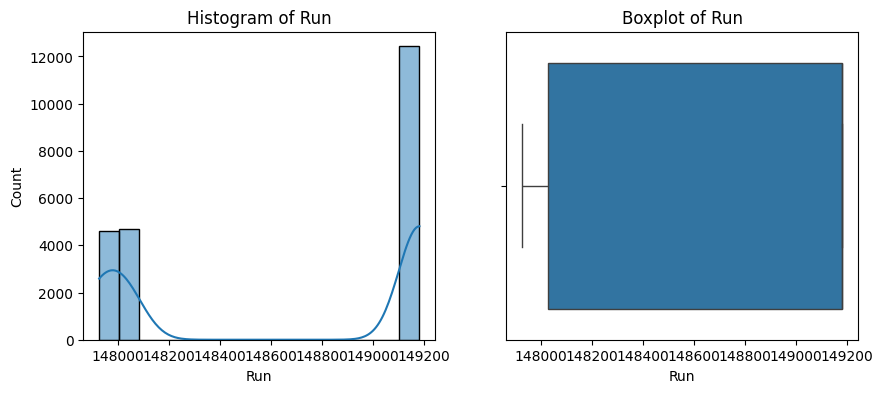

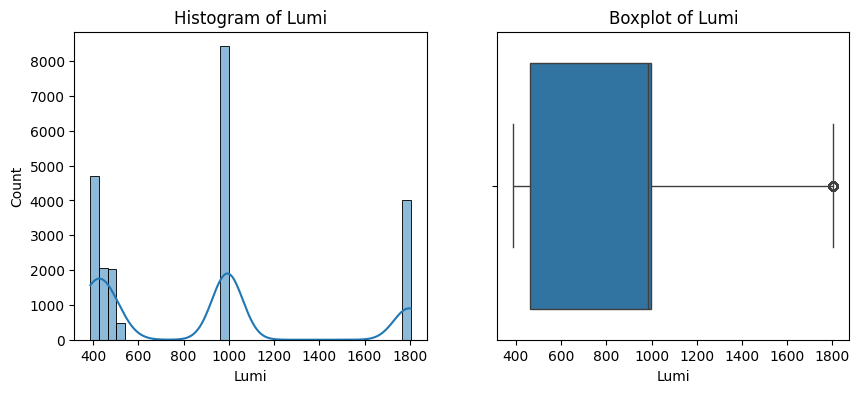

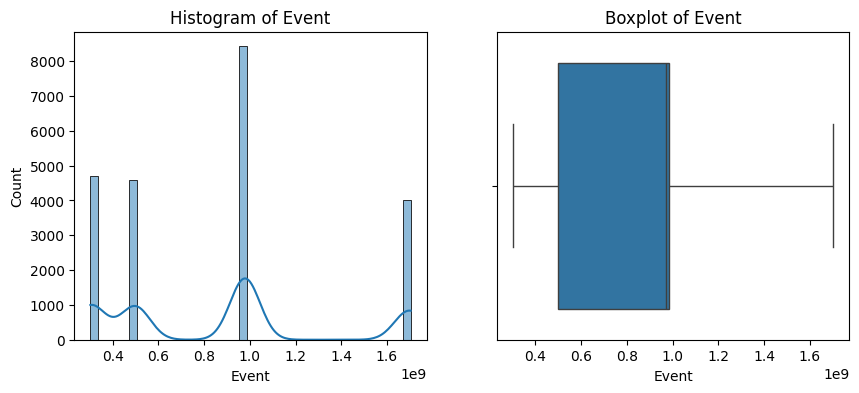

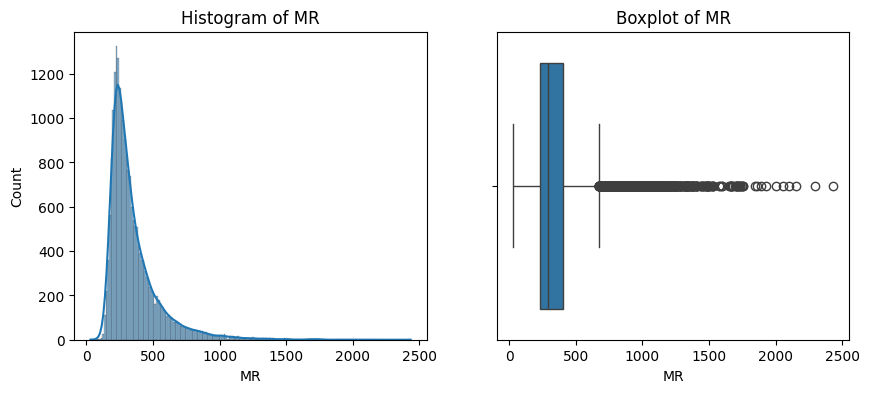

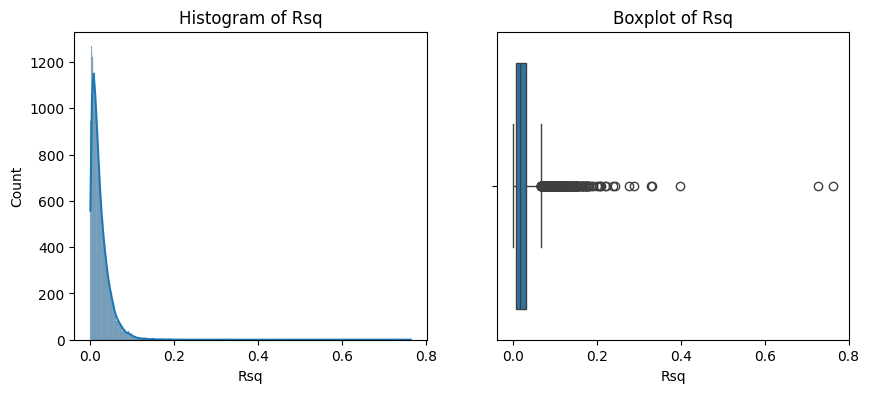

...

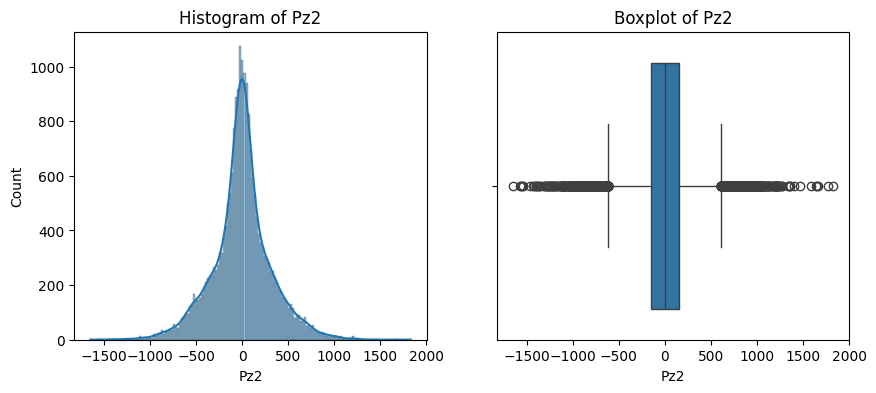

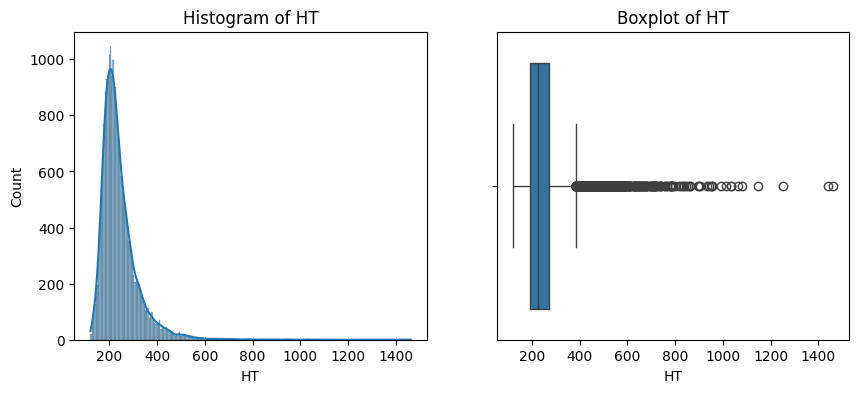

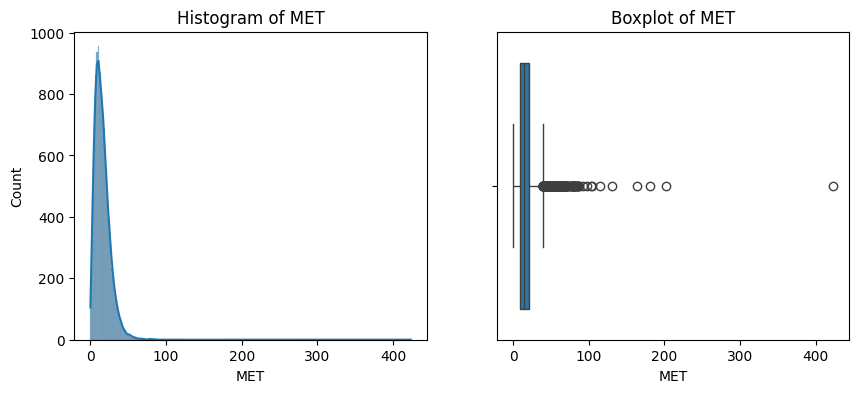

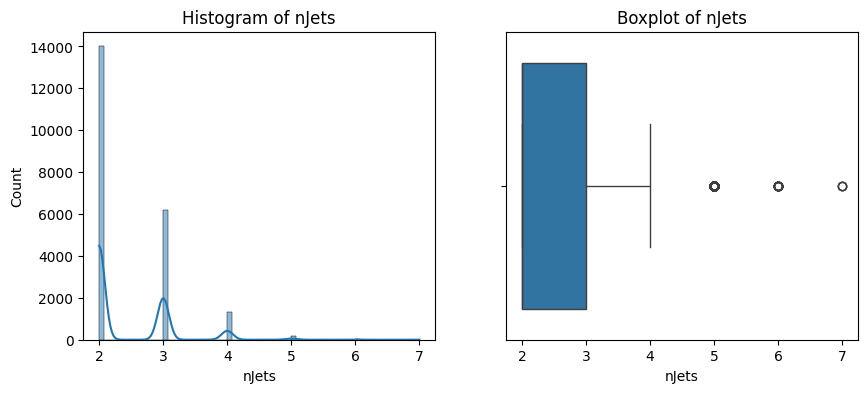

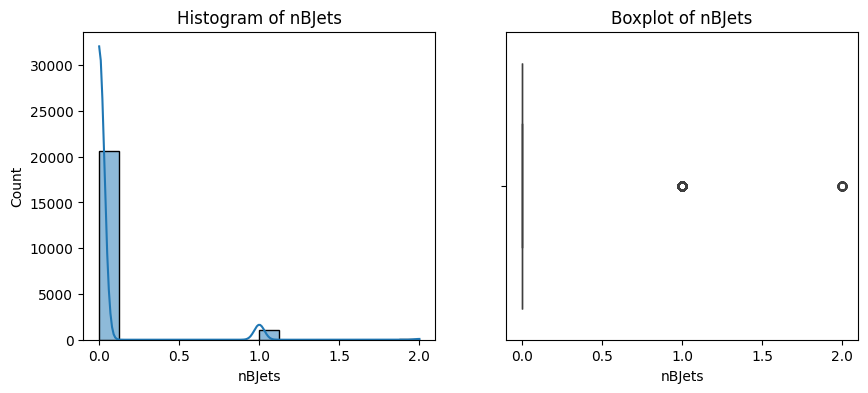

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Univariate Analysis
# For numerical columns: plot histograms or boxplots
for column in data.select_dtypes(include='number').columns:
    plt.figure(figsize=(10, 4))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(data[column], kde=True)
    plt.title(f'Histogram of {column}')

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=data[column])
    plt.title(f'Boxplot of {column}')

    plt.show()

# For categorical columns: plot bar charts
for column in data.select_dtypes(include='object').columns:
    plt.figure(figsize=(10, 4))
    sns.countplot(x=column, data=data)
    plt.title(f'Bar chart of {column}')
    plt.xticks(rotation=45)
    plt.show()


Descriptive statistics for MR:
count    21726.000000
mean       351.981435
std        193.691363
min         29.999900
25%        229.790750
50%        292.911000
75%        406.883000
max       2433.820000
Name: MR, dtype: float64 

Descriptive statistics for Rsq:
count    21726.000000
mean         0.023253
std          0.023291
min          0.000009
25%          0.007907
50%          0.016817
75%          0.031612
max          0.763695
Name: Rsq, dtype: float64 

Descriptive statistics for HT:
count    21726.000000
mean       242.328342
std         78.841528
min        120.938000
25%        193.252000
50%        223.696000
75%        269.241500
max       1462.630000
Name: HT, dtype: float64 

Descriptive statistics for MET:
count    21726.000000
mean        16.005371
std         10.797882
min          0.100445
25%          8.626845
50%         14.035000
75%         21.091050
max        423.144000
Name: MET, dtype: float64 

Descriptive statistics for nJets:
count    21726.000000
mean

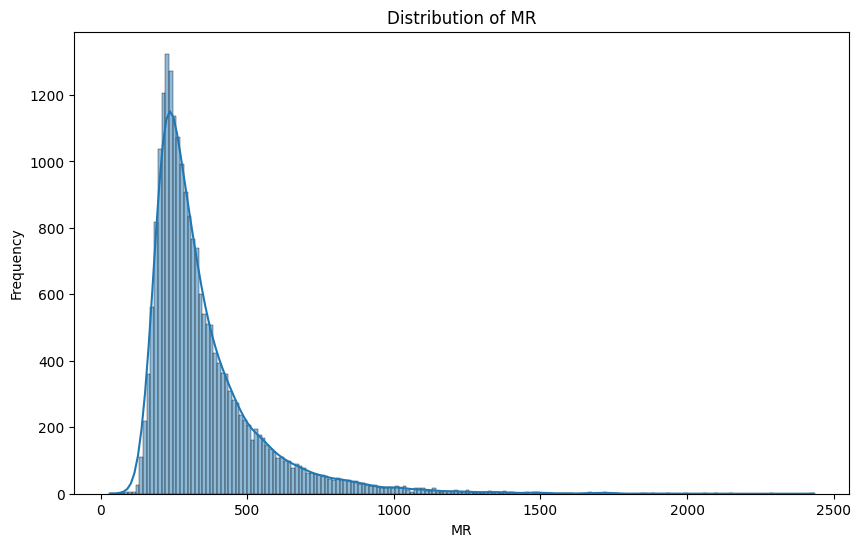

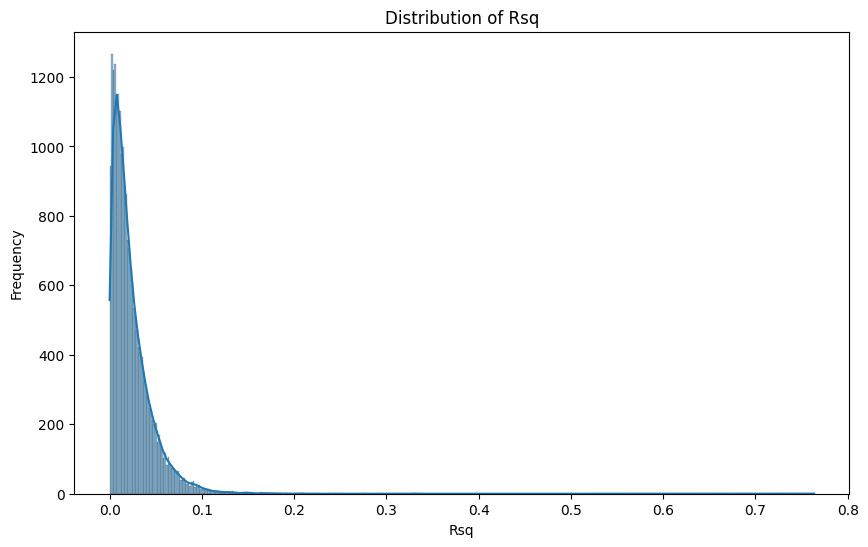

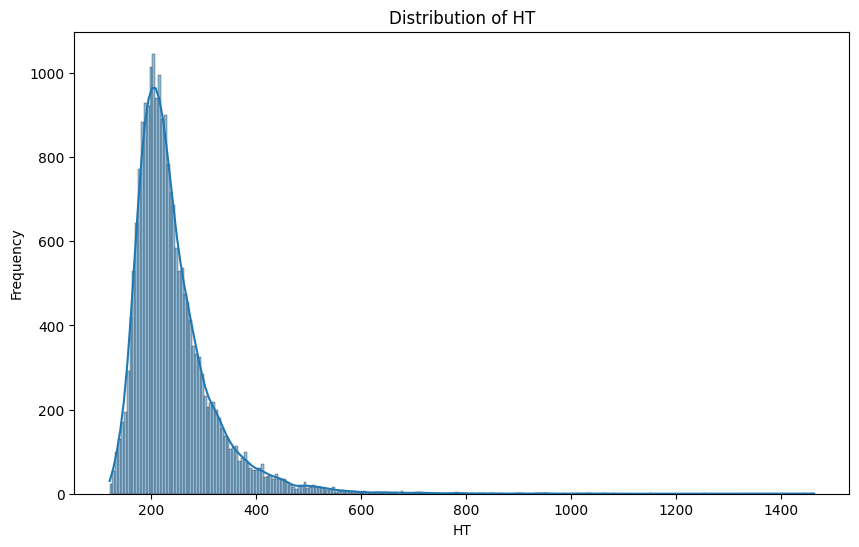

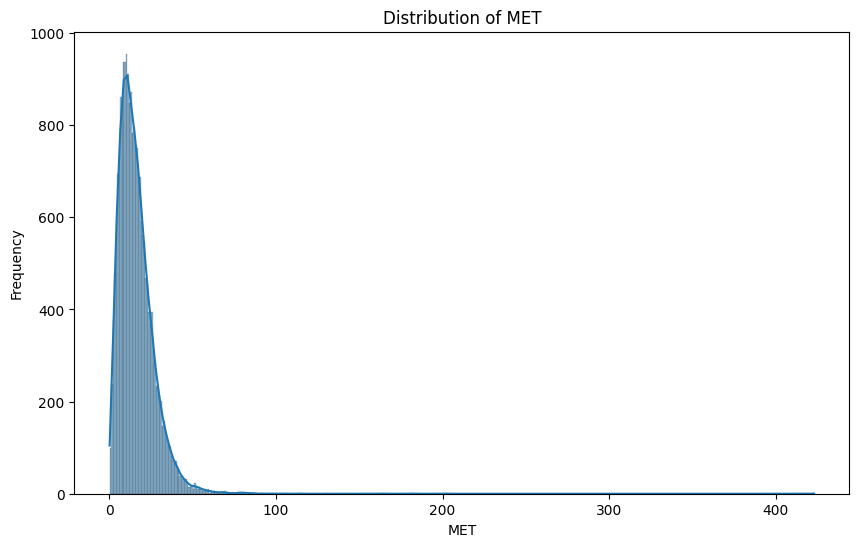

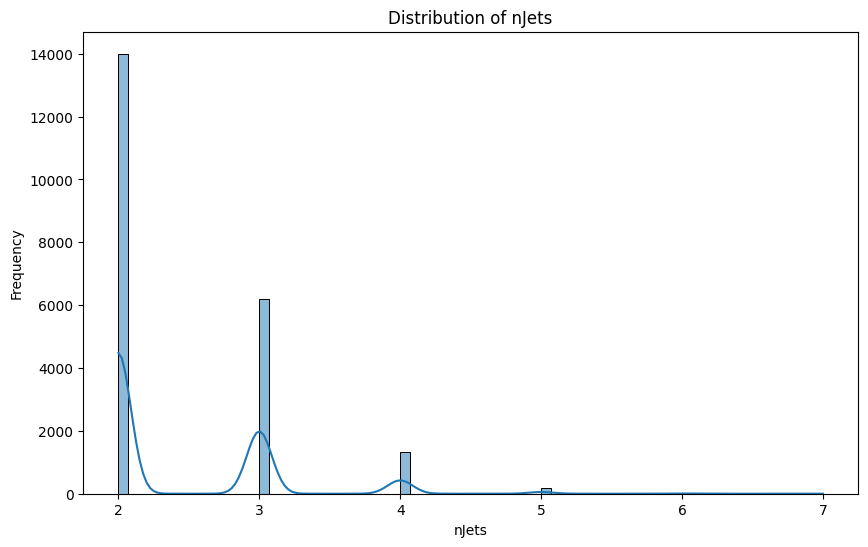

...

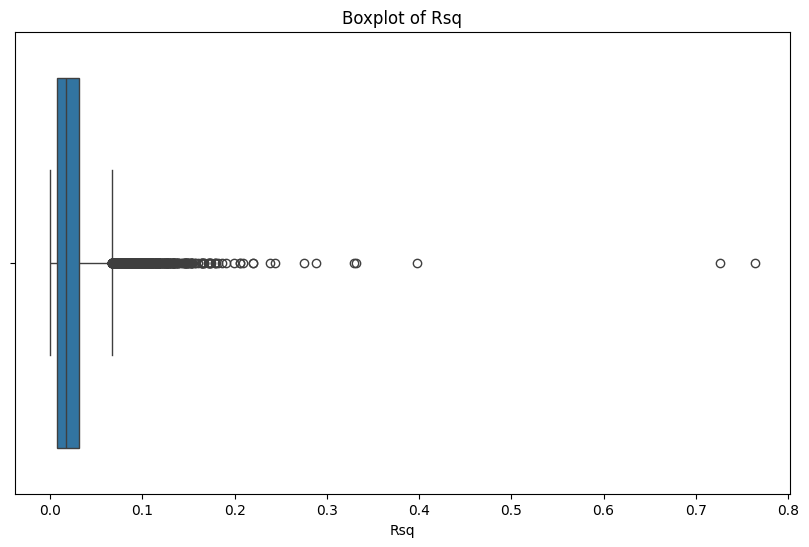

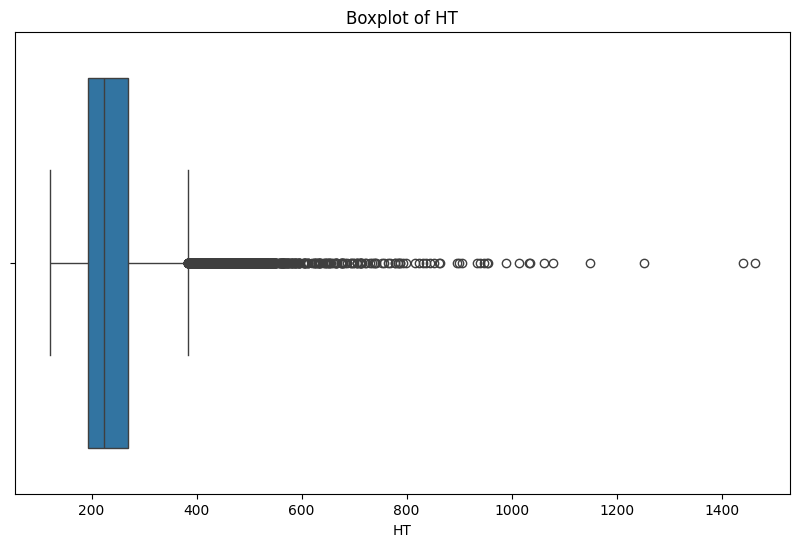

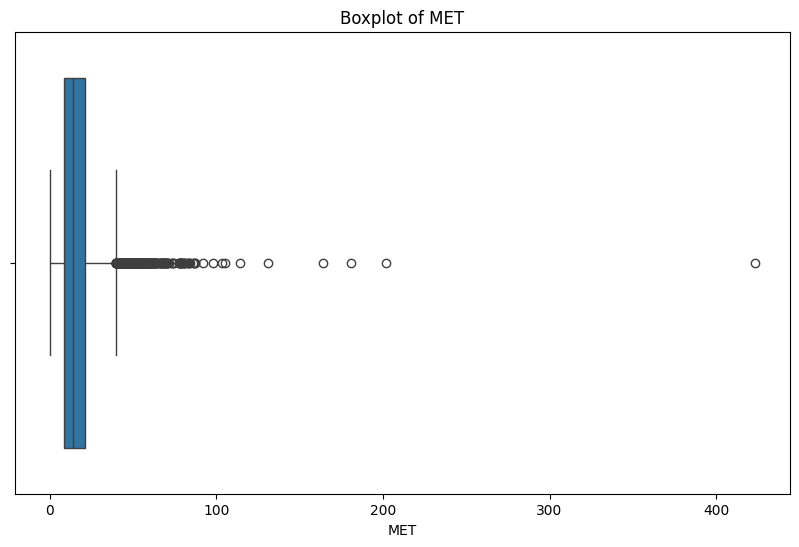

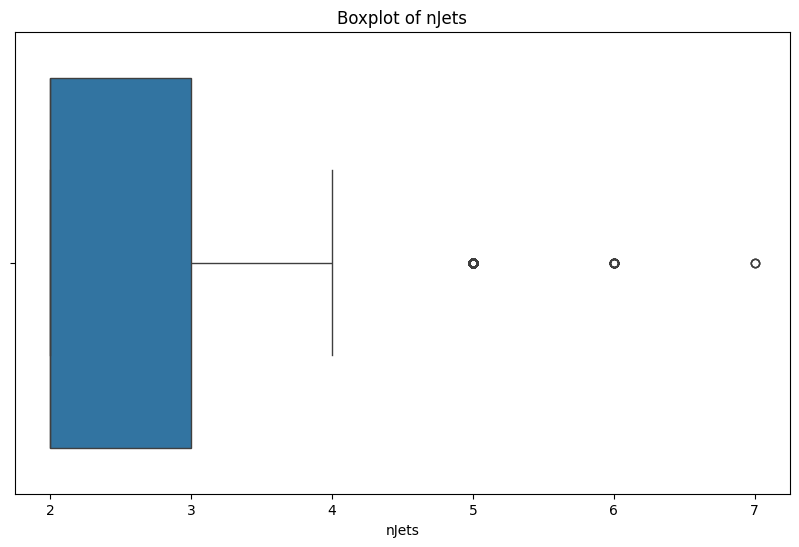

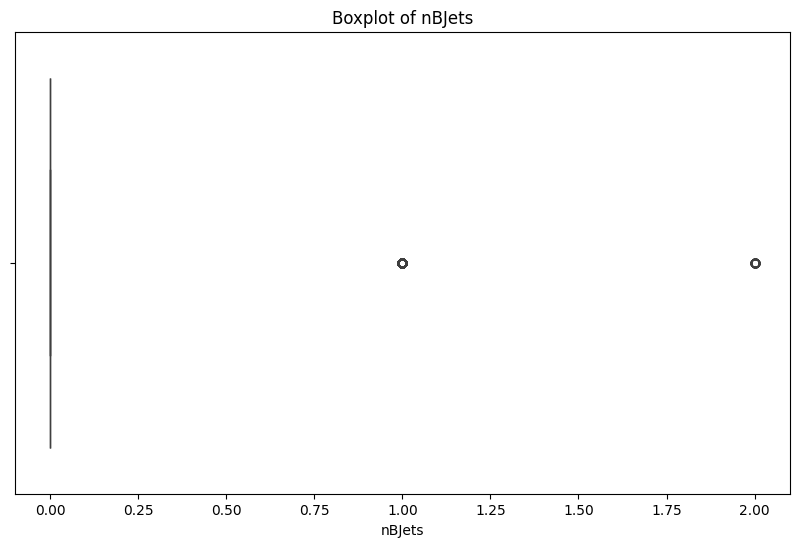

In [ ]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# List of variables to analyze - adjust according to your analysis focus
variables_to_analyze = ['MR', 'Rsq', 'HT', 'MET', 'nJets', 'nBJets']

# Generate descriptive statistics for each variable
for variable in variables_to_analyze:
    print(f"Descriptive statistics for {variable}:")
    print(data[variable].describe(), '\n')

# Generate histograms for each variable to understand their distribution
for variable in variables_to_analyze:
    plt.figure(figsize=(10, 6))
    sns.histplot(data[variable], kde=True)
    plt.title(f'Distribution of {variable}')
    plt.xlabel(variable)
    plt.ylabel('Frequency')
    plt.show()

# Generate boxplots for each variable to spot outliers
for variable in variables_to_analyze:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=data[variable])
    plt.title(f'Boxplot of {variable}')
    plt.xlabel(variable)
    plt.show()

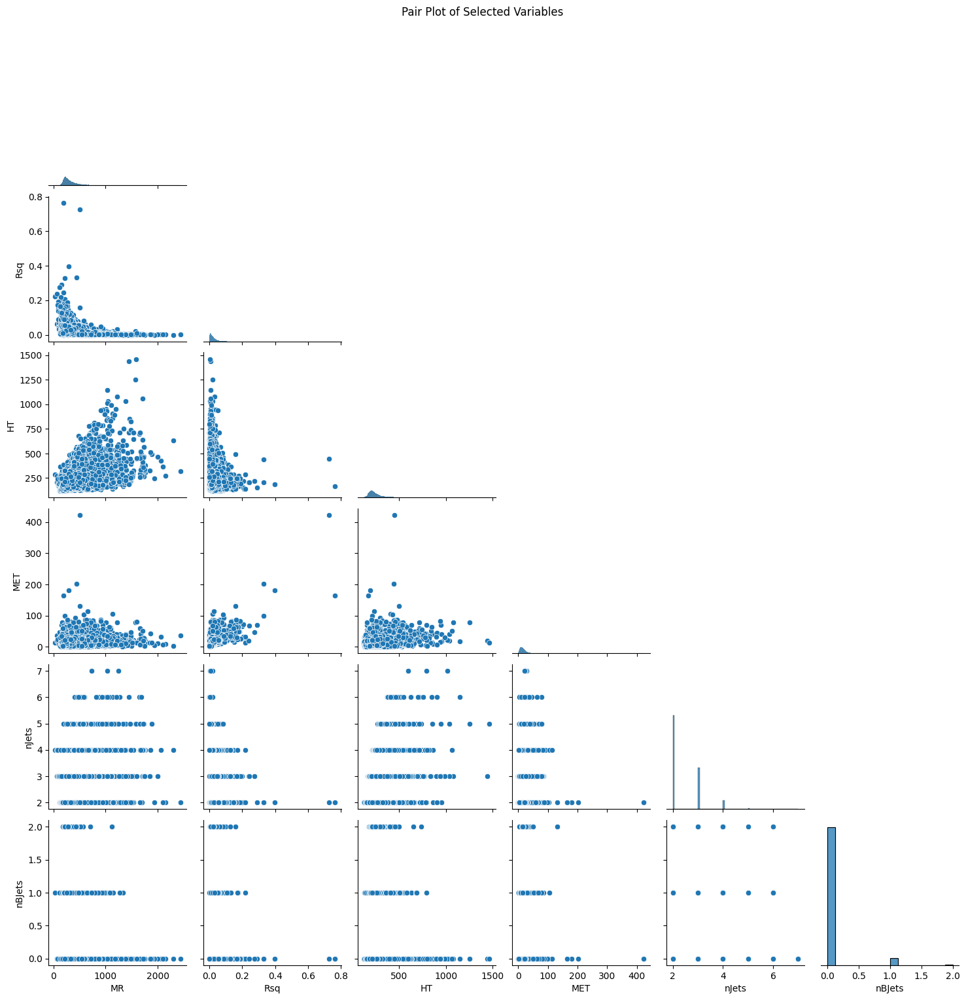

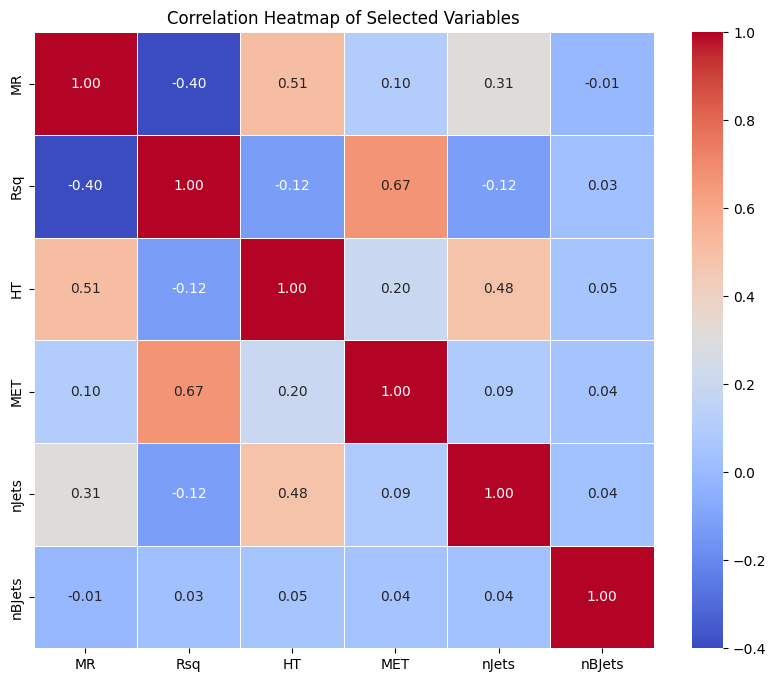

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Select variables for bivariate analysis - adjust as needed
variables_to_analyze = ['MR', 'Rsq', 'HT', 'MET', 'nJets', 'nBJets']

# Create a pair plot to visualize relationships between variables
sns.pairplot(data[variables_to_analyze], corner=True)
plt.suptitle('Pair Plot of Selected Variables', y=1.02)
plt.show()

# Compute the correlation matrix
corr_matrix = data[variables_to_analyze].corr()

# Generate a heatmap to visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap of Selected Variables')
plt.show()

# Bivariate Analysis

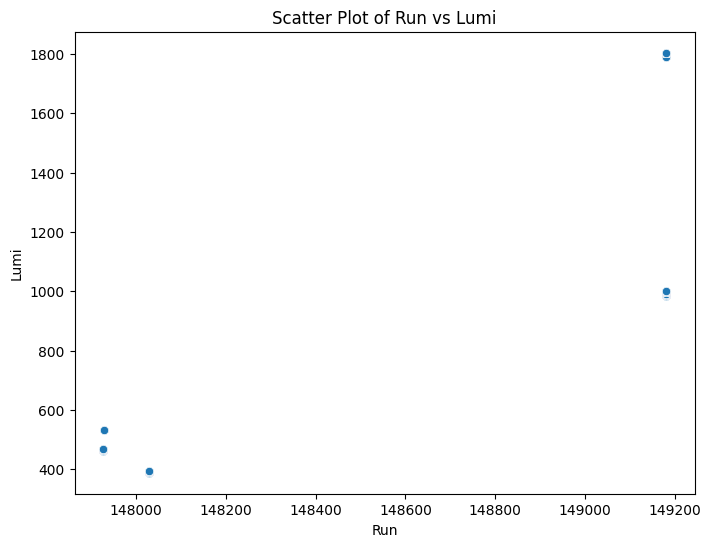

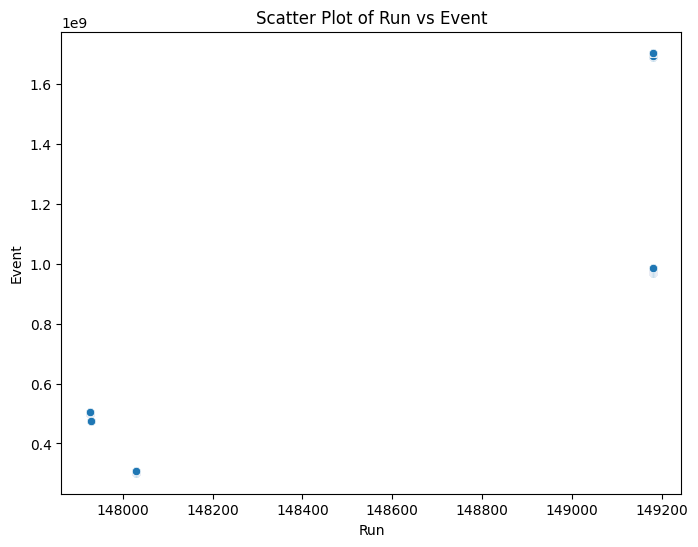

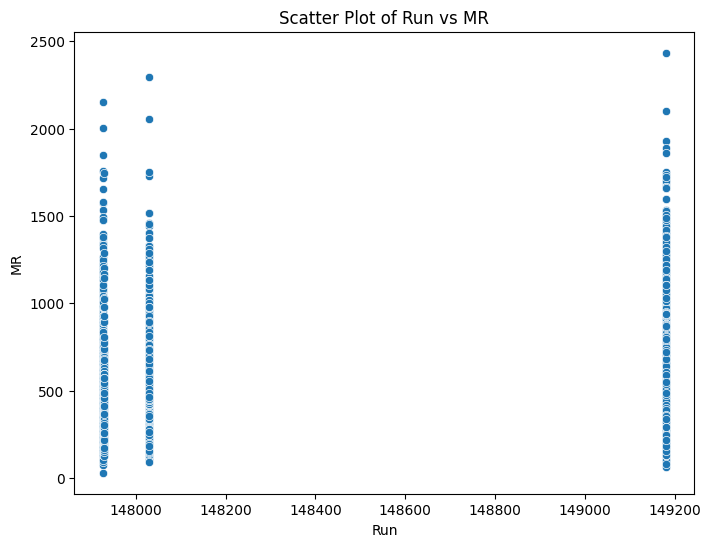

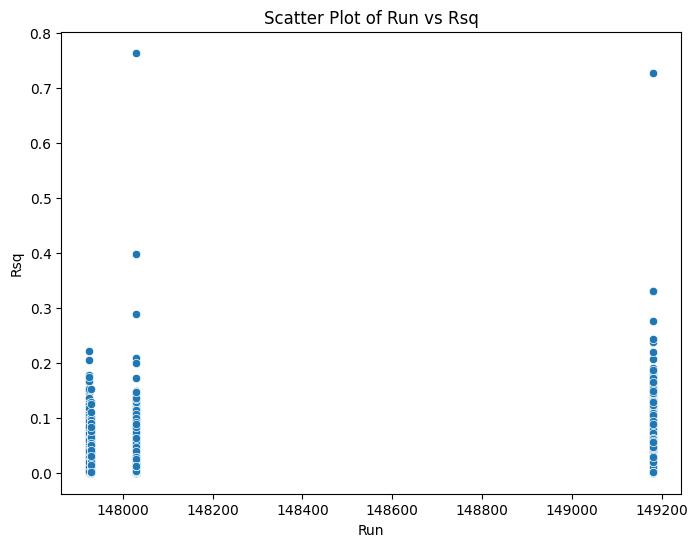

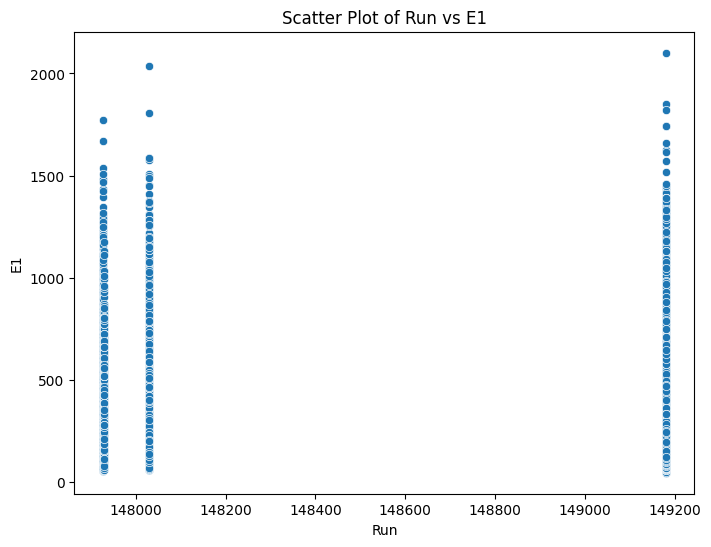

...

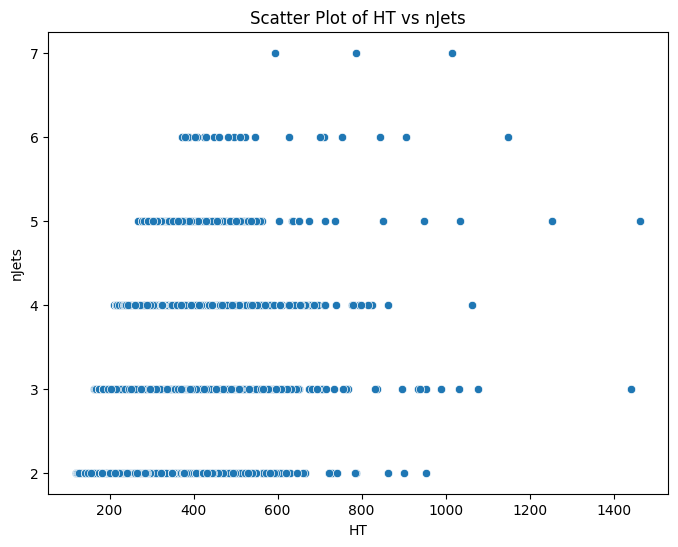

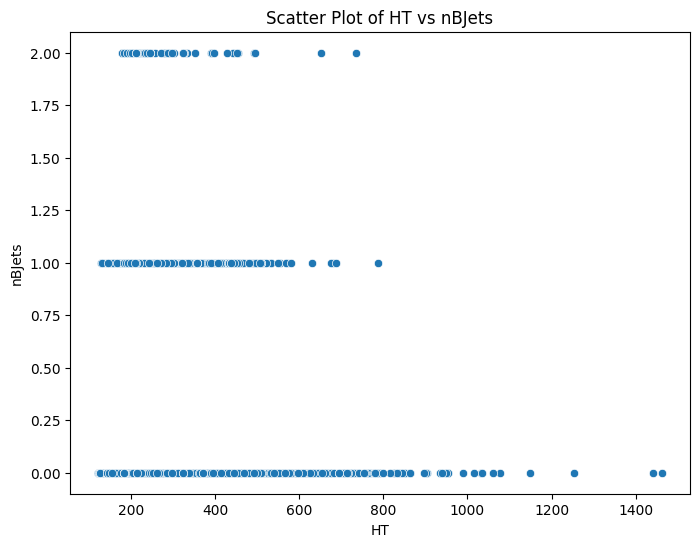

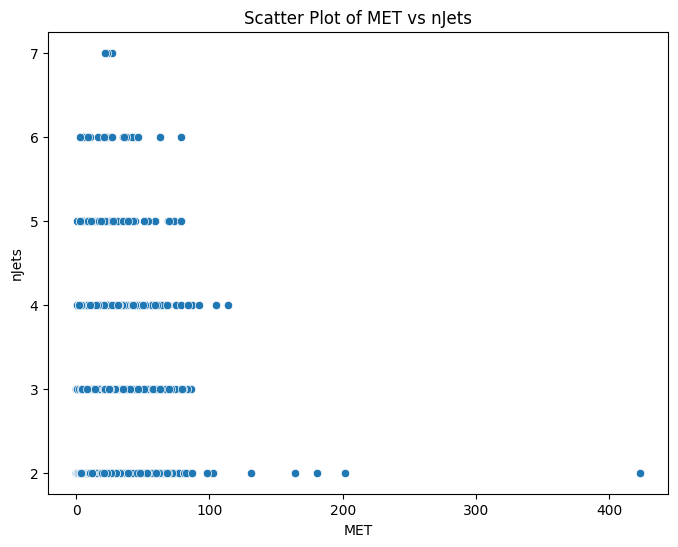

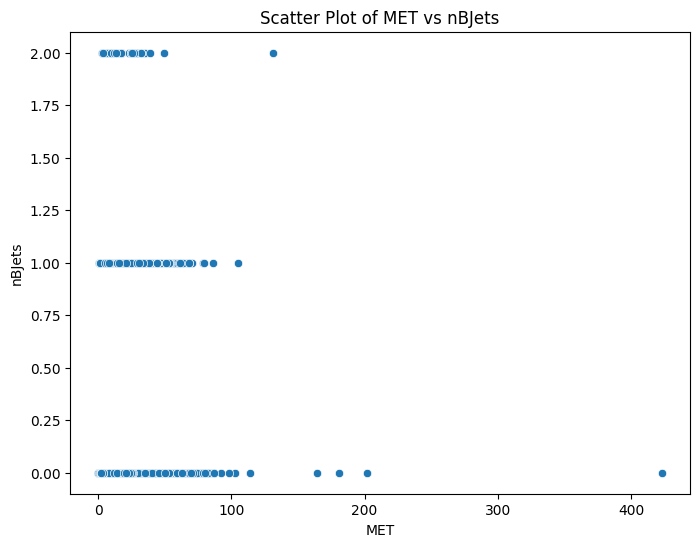

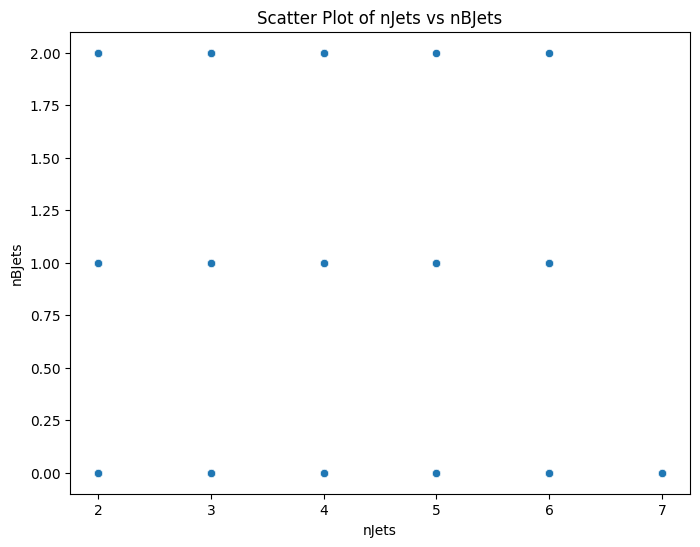

In [ ]:
# Bivariate Analysis
import pandas as pd
import matplotlib.pyplot as plt  # Corrected import
import seaborn as sns

# Numerical-Numerical pairs: Scatter plots
numerical_columns = data.select_dtypes(include='number').columns
for i in range(len(numerical_columns)):
    for j in range(i+1, len(numerical_columns)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=numerical_columns[i], y=numerical_columns[j], data=data)
        plt.title(f'Scatter Plot of {numerical_columns[i]} vs {numerical_columns[j]}')
        plt.show()

# Categorical-Numerical pairs: Boxplots
categorical_columns = data.select_dtypes(include='object').columns
for num_col in numerical_columns:
    for cat_col in categorical_columns:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=cat_col, y=num_col, data=data)
        plt.title(f'Boxplot of {num_col} by {cat_col}')
        plt.xticks(rotation=45)
        plt.show()

# Categorical-Categorical pairs: Heatmap of contingency table
for i in range(len(categorical_columns)):
    for j in range(i+1, len(categorical_columns)):
        contingency_table = pd.crosstab(data[categorical_columns[i]], data[categorical_columns[j]])
        plt.figure(figsize=(10, 8))
        sns.heatmap(contingency_table, annot=True, cmap='viridis')
        plt.title(f'Heatmap of {categorical_columns[i]} vs {categorical_columns[j]}')
        plt.show()


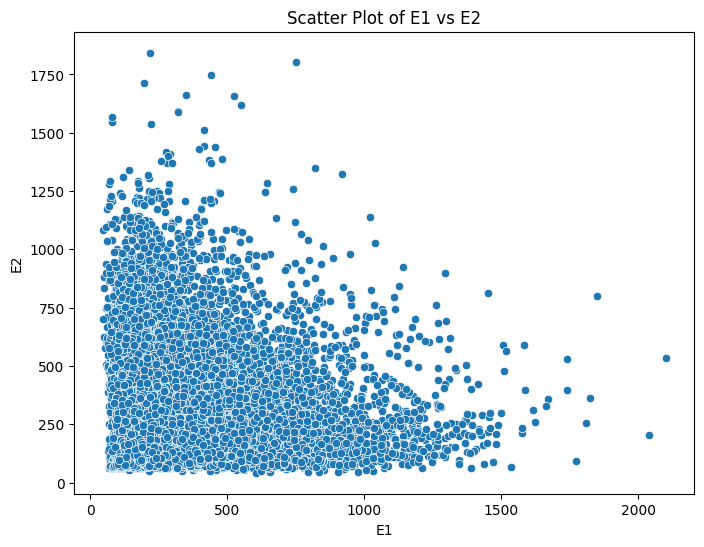

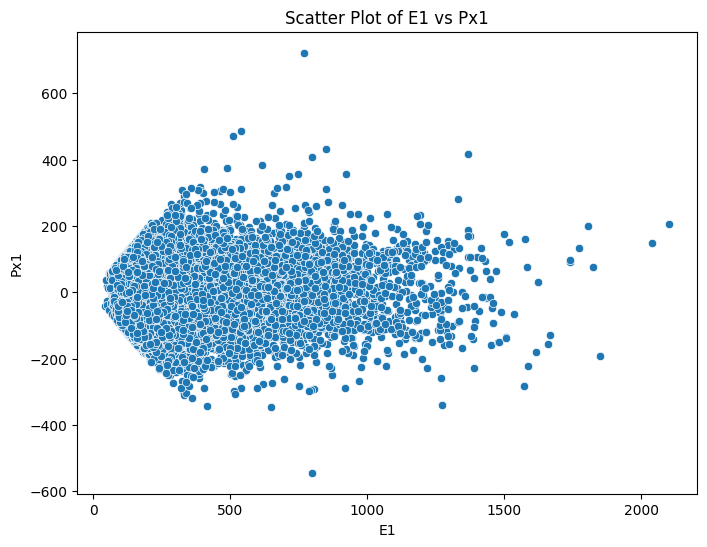

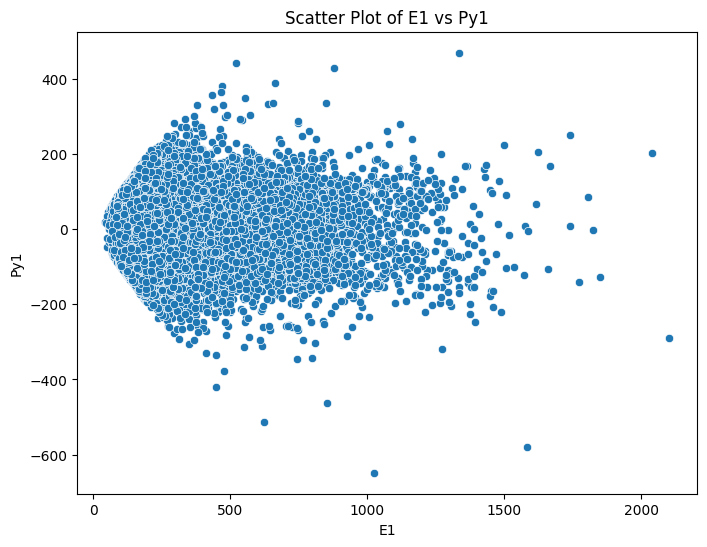

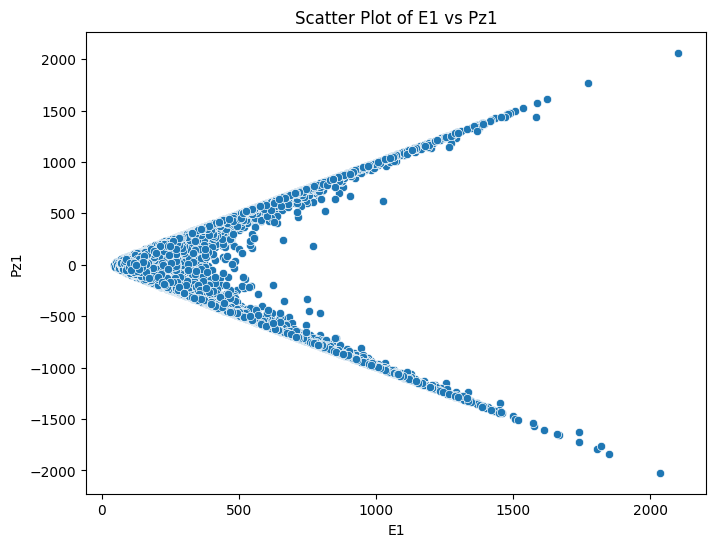

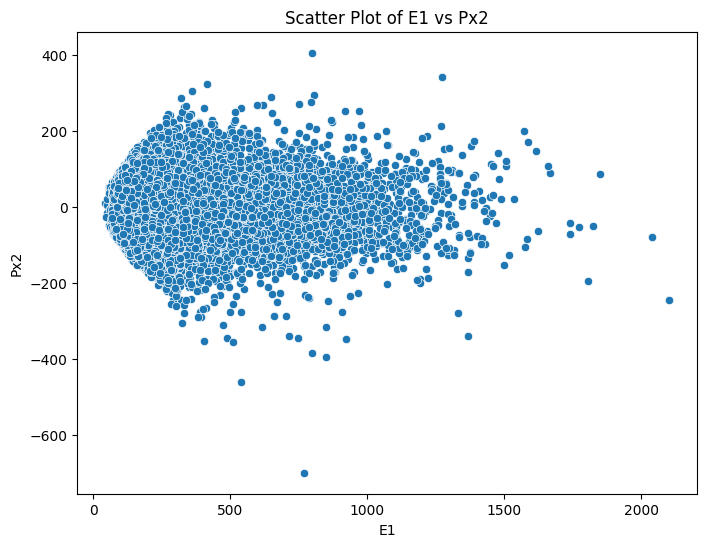

...

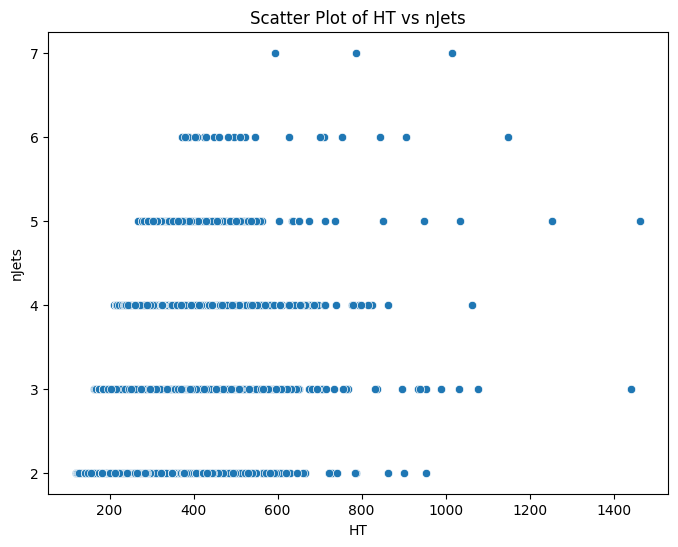

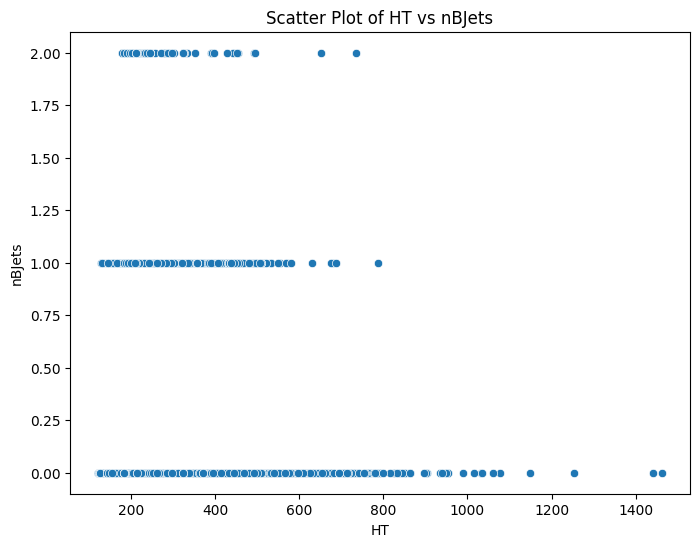

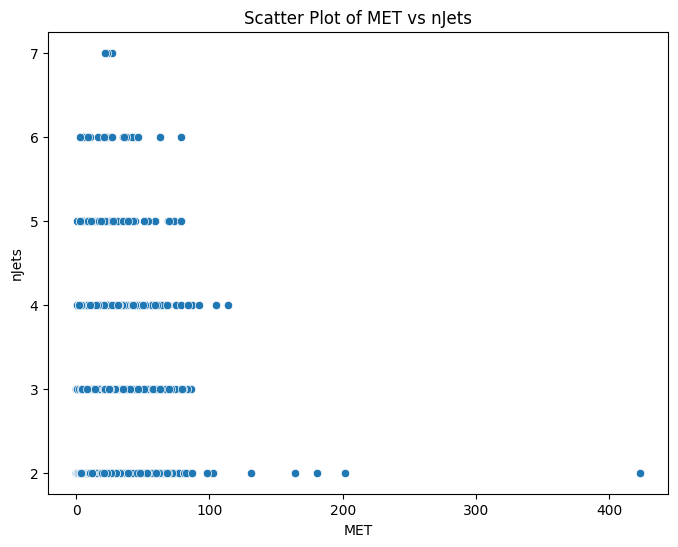

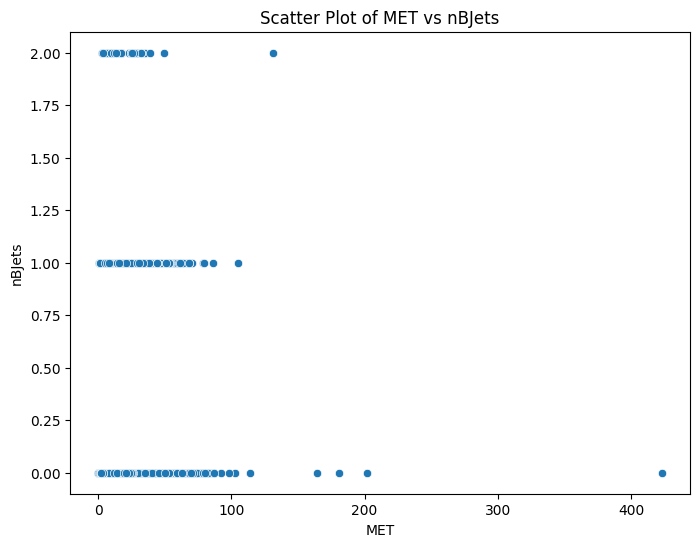

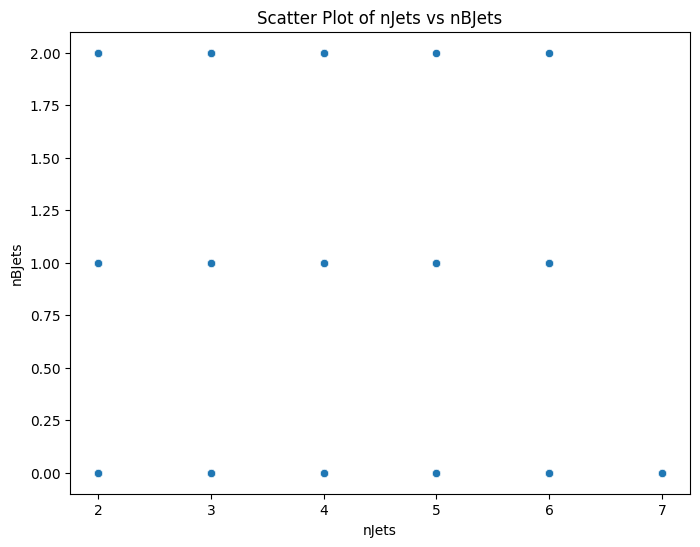

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Selecting only the most relevant numerical columns for your project
relevant_columns = ['E1', 'E2', 'Px1', 'Py1', 'Pz1', 'Px2', 'Py2', 'Pz2', 'HT', 'MET', 'nJets', 'nBJets']

# Plotting scatter plots for these key features against each other
for i in range(len(relevant_columns)):
    for j in range(i+1, len(relevant_columns)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=relevant_columns[i], y=relevant_columns[j], data=data)
        plt.title(f'Scatter Plot of {relevant_columns[i]} vs {relevant_columns[j]}')
        plt.show()


# CNN Model



In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, MaxPooling1D

# Load your dataset

# Convert the 'nBJets' column to a binary target variable
# Assuming that any non-zero value in 'nBJets' indicates the presence of bottom jets
data['nBJets'] = data['nBJets'].apply(lambda x: 1 if x > 0 else 0)

# Extract features and the binary target variable
features = data.drop(['nBJets'], axis=1)  # Drop the target column to isolate features
target = data['nBJets']  # Your binary target column

# Normalize the feature data
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Reshape scaled features for CNN input
X = scaled_features.reshape(scaled_features.shape[0], scaled_features.shape[1], 1)
y = target.values.reshape(-1, 1)  # Ensure the target is the correct shape

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the CNN model
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train.shape[1], 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(50, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Binary classification

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test data
evaluation = model.evaluate(X_test, y_test, verbose=0)

# Output the accuracy of the model on the test data
print(f'Test Accuracy: {evaluation[1]*100:.2f}%')


Epoch 1/10
544/544 [==============================] - 3s 3ms/step - loss: 0.2106 - accuracy: 0.9474 - val_loss: 0.2002 - val_accuracy: 0.9501
Epoch 2/10
544/544 [==============================] - 1s 2ms/step - loss: 0.2025 - accuracy: 0.9486 - val_loss: 0.1991 - val_accuracy: 0.9501
Epoch 3/10
544/544 [==============================] - 1s 2ms/step - loss: 0.2019 - accuracy: 0.9486 - val_loss: 0.1997 - val_accuracy: 0.9501
Epoch 4/10
544/544 [==============================] - 1s 2ms/step - loss: 0.2009 - accuracy: 0.9486 - val_loss: 0.1985 - val_accuracy: 0.9501
Epoch 5/10
544/544 [==============================] - 1s 2ms/step - loss: 0.2013 - accuracy: 0.9486 - val_loss: 0.2025 - val_accuracy: 0.9501
Epoch 6/10
544/544 [==============================] - 1s 2ms/step - loss: 0.2013 - accuracy: 0.9486 - val_loss: 0.1996 - val_accuracy: 0.9501
Epoch 7/10
544/544 [==============================] - 1s 2ms/step - loss: 0.2006 - accuracy: 0.9486 - val_loss: 0.1990 - val_accuracy: 0.9501
Epoch 

In [ ]:
from tensorflow.keras.layers import Dropout, Input, Add
from tensorflow.keras.models import Model

# Function to create a CNN block with residual connections
def resnet_block(input, filters, kernel_size):
    x = Conv1D(filters=filters, kernel_size=kernel_size, activation='relu', padding='same')(input)
    x = Conv1D(filters=filters, kernel_size=kernel_size, activation=None, padding='same')(x)
    x = Add()([x, input])
    x = tf.nn.relu(x)
    return x

# Define the input
input_layer = Input(shape=(X_train.shape[1], 1))

# Define the CNN layers with residual connections
x = Conv1D(filters=64, kernel_size=2, activation='relu')(input_layer)
x = MaxPooling1D(pool_size=2)(x)
x = resnet_block(x, filters=64, kernel_size=2)
x = Dropout(0.5)(x)  # Dropout added for regularization
x = Flatten()(x)
x = Dense(50, activation='relu')(x)
x = Dropout(0.5)(x)  # Another dropout layer for regularization
output_layer = Dense(1, activation='sigmoid')(x)

# Create the model
model = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test data
evaluation = model.evaluate(X_test, y_test, verbose=0)

# Output the accuracy of the model on the test data
print(f'Test Accuracy: {evaluation[1]*100:.2f}%')


Epoch 1/10
544/544 [==============================] - 3s 4ms/step - loss: 0.2243 - accuracy: 0.9463 - val_loss: 0.2015 - val_accuracy: 0.9501
Epoch 2/10
544/544 [==============================] - 2s 3ms/step - loss: 0.2141 - accuracy: 0.9486 - val_loss: 0.2038 - val_accuracy: 0.9501
Epoch 3/10
544/544 [==============================] - 2s 3ms/step - loss: 0.2124 - accuracy: 0.9486 - val_loss: 0.2049 - val_accuracy: 0.9501
Epoch 4/10
544/544 [==============================] - 2s 3ms/step - loss: 0.2095 - accuracy: 0.9486 - val_loss: 0.1988 - val_accuracy: 0.9501
Epoch 5/10
544/544 [==============================] - 2s 3ms/step - loss: 0.2102 - accuracy: 0.9486 - val_loss: 0.1979 - val_accuracy: 0.9501
Epoch 6/10
544/544 [==============================] - 2s 3ms/step - loss: 0.2085 - accuracy: 0.9486 - val_loss: 0.1991 - val_accuracy: 0.9501
Epoch 7/10
544/544 [==============================] - 2s 4ms/step - loss: 0.2072 - accuracy: 0.9486 - val_loss: 0.1985 - val_accuracy: 0.9501
Epoch 

In [ ]:
!pip install -q -U keras-tuner
import tensorflow as tf
from tensorflow.keras.layers import Dropout, Input, Add, Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.optimizers import Adam
from kerastuner.tuners import RandomSearch

# Function to create a CNN block with residual connections
def resnet_block(input, filters, kernel_size):
    x = Conv1D(filters=filters, kernel_size=kernel_size, activation='relu', padding='same')(input)
    x = Conv1D(filters=filters, kernel_size=kernel_size, activation=None, padding='same')(x)

    # Adjust the shortcut connection to match the shape
    shortcut = Conv1D(filters=filters, kernel_size=1, activation=None, padding='same')(input)

    x = Add()([x, shortcut])
    x = tf.nn.relu(x)
    return x

# Function to create a model with given hyperparameters
def build_model(hp):
    input_layer = Input(shape=(X_train.shape[1], 1))

    x = Conv1D(
        filters=hp.Int('conv_1_filter', min_value=32, max_value=128, step=16),
        kernel_size=hp.Choice('conv_1_kernel', values=[2, 3]),
        activation='relu'
    )(input_layer)
    x = MaxPooling1D(pool_size=2)(x)

    # ResNet block
    for i in range(hp.Int('n_resnet_blocks', 1, 3)):
        x = resnet_block(x, filters=hp.Int(f'resnet_block_{i}_filters', 32, 128, 16), kernel_size=2)

    x = Dropout(rate=hp.Float('dropout_1', min_value=0.2, max_value=0.5, step=0.1))(x)
    x = Flatten()(x)

    x = Dense(
        units=hp.Int('dense_1_units', min_value=32, max_value=128, step=16),
        activation='relu'
    )(x)
    x = Dropout(rate=hp.Float('dropout_2', min_value=0.2, max_value=0.5, step=0.1))(x)

    output_layer = Dense(1, activation='sigmoid')(x)

    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(
                      hp.Float('learning_rate', 1e-4, 1e-2, sampling='log'), clipnorm=1.0),
                  loss='binary_crossentropy', metrics=['accuracy'])

    return model

# Early Stopping - stop training when the validation loss starts to increase
early_stopping = EarlyStopping(monitor='val_loss', patience=3)  # Reduced patience

# Learning Rate Scheduler - function to reduce the learning rate as epochs increase
def scheduler(epoch, lr):
    if epoch < 5:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

lr_scheduler = LearningRateScheduler(scheduler)

# Create a tuner with reduced number of trials
tuner = RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=3,  # Reduced number of trials
    executions_per_trial=2,  # Reduced number of executions per trial
    directory='my_dir',
    project_name='resnet_hyperparam_tuning'
)

# Search for the best hyperparameters with reduced epochs and added verbosity
tuner.search(X_train, y_train, epochs=5, validation_data=(X_test, y_test), callbacks=[early_stopping, lr_scheduler], verbose=2)

# Get the best model
best_model = tuner.get_best_models(num_models=1)[0]

# Train the best model with callbacks for early stopping and learning rate scheduling
history = best_model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test), callbacks=[early_stopping, lr_scheduler])

# Evaluate the best model
evaluation = best_model.evaluate(X_test, y_test, verbose=0)
print(f'Test Accuracy: {evaluation[1]*100:.2f}%')


Trial 3 Complete [00h 00m 43s]
val_accuracy: 0.950069010257721

Best val_accuracy So Far: 0.950069010257721
Total elapsed time: 00h 02m 04s
Epoch 1/10
544/544 [==============================] - 4s 4ms/step - loss: 0.2055 - accuracy: 0.9486 - val_loss: 0.1985 - val_accuracy: 0.9501 - lr: 0.0011
Epoch 2/10
544/544 [==============================] - 2s 4ms/step - loss: 0.2051 - accuracy: 0.9486 - val_loss: 0.1974 - val_accuracy: 0.9501 - lr: 0.0011
Epoch 3/10
544/544 [==============================] - 2s 4ms/step - loss: 0.2048 - accuracy: 0.9486 - val_loss: 0.1978 - val_accuracy: 0.9501 - lr: 0.0011
Epoch 4/10
544/544 [==============================] - 2s 4ms/step - loss: 0.2025 - accuracy: 0.9486 - val_loss: 0.1974 - val_accuracy: 0.9501 - lr: 0.0011
Epoch 5/10
544/544 [==============================] - 3s 5ms/step - loss: 0.2045 - accuracy: 0.9486 - val_loss: 0.2008 - val_accuracy: 0.9501 - lr: 0.0011
Epoch 6/10
544/544 [==============================] - 2s 4ms/step - loss: 0.2025 - ac

# RNN Model


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense


# Select features and target. Assuming 'nBJets' is the target variable.
X = data.drop(['nBJets'], axis=1)
y = data['nBJets']

# Convert target to binary (presence or absence of bottom quarks)
y = (y > 0).astype(int)

# Normalize the feature data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Reshape data for RNN input (samples, time steps, features)
# Here we have a feature at each time step
X_scaled = X_scaled.reshape(X_scaled.shape[0], X_scaled.shape[1], 1)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Define the RNN model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], 1)))
model.add(LSTM(units=20, return_sequences=False))
model.add(Dense(units=1, activation='sigmoid'))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

# Evaluate the model on the test data
evaluation = model.evaluate(X_test, y_test, verbose=0)

# Output the accuracy of the model on the test data
print(f'Test Accuracy: {evaluation[1]*100:.2f}%')



Epoch 1/10
435/435 [==============================] - 8s 11ms/step - loss: 0.2221 - accuracy: 0.9469 - val_loss: 0.1916 - val_accuracy: 0.9525
Epoch 2/10
435/435 [==============================] - 4s 9ms/step - loss: 0.2049 - accuracy: 0.9476 - val_loss: 0.1904 - val_accuracy: 0.9525
Epoch 3/10
435/435 [==============================] - 4s 9ms/step - loss: 0.2042 - accuracy: 0.9476 - val_loss: 0.1903 - val_accuracy: 0.9525
Epoch 4/10
435/435 [==============================] - 5s 10ms/step - loss: 0.2038 - accuracy: 0.9476 - val_loss: 0.1930 - val_accuracy: 0.9525
Epoch 5/10
435/435 [==============================] - 4s 9ms/step - loss: 0.2037 - accuracy: 0.9476 - val_loss: 0.1897 - val_accuracy: 0.9525
Epoch 6/10
435/435 [==============================] - 4s 9ms/step - loss: 0.2036 - accuracy: 0.9476 - val_loss: 0.1905 - val_accuracy: 0.9525
Epoch 7/10
435/435 [==============================] - 4s 10ms/step - loss: 0.2032 - accuracy: 0.9476 - val_loss: 0.1911 - val_accuracy: 0.9525
Epo

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.regularizers import l2


# Select features and target. Assuming 'nBJets' is the target variable.
X = data.drop(['nBJets'], axis=1)
y = data['nBJets']

# Convert target to binary (presence or absence of bottom quarks)
y = (y > 0).astype(int)

# Normalize the feature data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Reshape data for RNN input (samples, time steps, features)
# Here we have a feature at each time step
X_scaled = X_scaled.reshape(X_scaled.shape[0], X_scaled.shape[1], 1)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Define the RNN model with added dropout and regularization
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], 1)))
model.add(Dropout(0.2))  # Dropout for regularization
model.add(LSTM(units=20, return_sequences=False))
model.add(Dropout(0.2))  # Dropout for regularization
model.add(Dense(units=1, activation='sigmoid', kernel_regularizer=l2(0.01)))  # L2 regularization

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Early Stopping and Learning Rate Scheduling
early_stopping = EarlyStopping(monitor='val_loss', patience=5)

def scheduler(epoch, lr):
    if epoch < 5:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

lr_scheduler = LearningRateScheduler(scheduler)

# Train the model with callbacks
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2, callbacks=[early_stopping, lr_scheduler])

# Evaluate the model on the test data
evaluation = model.evaluate(X_test, y_test, verbose=0)

# Output the accuracy of the model on the test data
print(f'Test Accuracy: {evaluation[1]*100:.2f}%')

Epoch 1/10
435/435 [==============================] - 8s 11ms/step - loss: 0.2446 - accuracy: 0.9440 - val_loss: 0.1999 - val_accuracy: 0.9525 - lr: 0.0010
Epoch 2/10
435/435 [==============================] - 4s 10ms/step - loss: 0.2173 - accuracy: 0.9476 - val_loss: 0.1973 - val_accuracy: 0.9525 - lr: 0.0010
Epoch 3/10
435/435 [==============================] - 5s 11ms/step - loss: 0.2153 - accuracy: 0.9476 - val_loss: 0.1964 - val_accuracy: 0.9525 - lr: 0.0010
Epoch 4/10
435/435 [==============================] - 4s 10ms/step - loss: 0.2131 - accuracy: 0.9476 - val_loss: 0.1957 - val_accuracy: 0.9525 - lr: 0.0010
Epoch 5/10
435/435 [==============================] - 5s 11ms/step - loss: 0.2128 - accuracy: 0.9476 - val_loss: 0.1961 - val_accuracy: 0.9525 - lr: 0.0010
Epoch 6/10
435/435 [==============================] - 4s 10ms/step - loss: 0.2114 - accuracy: 0.9476 - val_loss: 0.1948 - val_accuracy: 0.9525 - lr: 9.0484e-04
Epoch 7/10
435/435 [==============================] - 4s 10m

# Analysis

**Model 1: Regular CNN**
--
Good balance between speed and accuracy. no signs of significant overfitting.




**Model 2: CNN with Residual Connections.**
--
 Slower than regular CNN model because of residual connections. No significant improvement in accuracy or performance. No remarkable benefit. Nnnecessary complexity.

**Model 3: CNN with Hyperparameter Tuning and Learning Rate Scheduling**
--
Longer time per epoch, due to hyperparameter tuning. Similar to control model, no real benefits.


---


**Model 4: Regular RNN**
--
Slightly better in terms of validation accuracy in comparison to CNN model. Sequential nature is benefical for this project.

**Model 5: RNN w/ Dropout Layers, L2 Regularization, Early Stopping, and Learning Rate Scheduling**
--
More complex and takes more time per epoch. However accuracy is not dramatically better. Slightly higher validation loss suggests the model is being regulairzed and is thus underfitting.



---
# Summary

**RNN vs CNN**
--
RNN slighlty outperforms the CNN model due to its sequential nature.

**Complexity vs Performance**
--
More complex models with residual connections, hyperparamter tuning, and regularization provide no drastic improvement. No need for additional complexity for this model

**Underfitting and Overfitting**
--
No signifcant signs of underfitting or overfitting.



---
# Futher Quetions

 **Feature Importance and Selection**
--
1. What features are most important in identifying bottom quarks?
2. Could feature selection or dimensionality reduction improve model performance?

**Model Interpretibality**
--
1. What can this model help particle physists do?
2. What implications does this model have in the future of paticle physics?

**Model Comparisona and Ensemble Methods**
--
1. How can we interepret various models?
2. How can we combine various models to improve accuracy?
3. Are there models that are best with specific subesections of the data?

**Optimization and Computational Effeciency**
--
1. How can we get a fast and effecient model with out sacrificing on accuracy and performance?

**Uncertainty Quantification**
--
1. How can uncertainty from the model be interpreted and explained?


#Random Forests

In [ ]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score


# Preparing the data
# Assuming the target variable is 'nBJets' and all other columns are features
X = data.drop('nBJets', axis=1)
y = data['nBJets']

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creating and training the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# The model is now trained and can be used to make predictions or evaluate its performance
# Example: predictions = rf_model.predict(X_test)

# Use the trained Random Forest model to make predictions on the test set
y_pred_rf = rf_model.predict(X_test)

# Calculate the classification report
report_rf = classification_report(y_test, y_pred_rf)
print("Random Forest Classification Report:\n", report_rf)

# Calculate and print the accuracy of the Random Forest model
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f'Random Forest Test Accuracy: {accuracy_rf*100:.2f}%')



Random Forest Classification Report:
               precision    recall  f1-score   support

           0       0.95      1.00      0.97      4129
           1       0.00      0.00      0.00       217

    accuracy                           0.95      4346
   macro avg       0.48      0.50      0.49      4346
weighted avg       0.90      0.95      0.93      4346

Random Forest Test Accuracy: 95.01%


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Descision Tree

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.utils.class_weight import compute_class_weight
import numpy as np


# Select features and target. Assuming 'nBJets' is the target variable.
X = data.drop(['nBJets'], axis=1)
y = data['nBJets']

# Convert target to binary (presence or absence of bottom quarks)
y = (y > 0).astype(int)

# Normalize the feature data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Calculate class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights_dict = {i : class_weights[i] for i in range(len(class_weights))}

# Initialize the Decision Tree Classifier with class weights
dt_model = DecisionTreeClassifier(class_weight=class_weights_dict)

# Fit the model to your training data
dt_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_dt = dt_model.predict(X_test)

# Calculate and print classification report
report_dt = classification_report(y_test, y_pred_dt)
print(report_dt)

# Calculate and output the accuracy of the decision tree model on the test data
accuracy_dt = accuracy_score(y_test, y_pred_dt)
print(f'Test Accuracy: {accuracy_dt*100:.2f}%')


              precision    recall  f1-score   support

           0       0.95      0.95      0.95      4129
           1       0.07      0.07      0.07       217

    accuracy                           0.90      4346
   macro avg       0.51      0.51      0.51      4346
weighted avg       0.91      0.90      0.91      4346

Test Accuracy: 90.45%


#Confusion Matrix

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


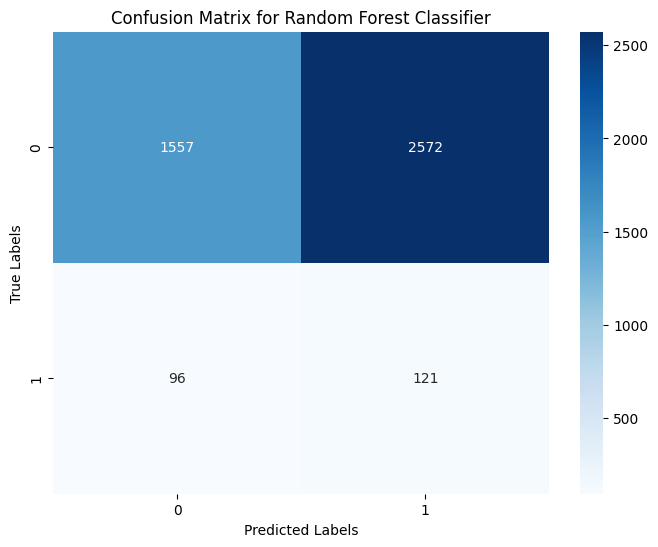

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate predictions from your trained Random Forest model
y_pred_rf = rf_model.predict(X_test)

# Calculate the confusion matrix
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)

# Visualize the confusion matrix using Seaborn's heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_rf, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix for Random Forest Classifier')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


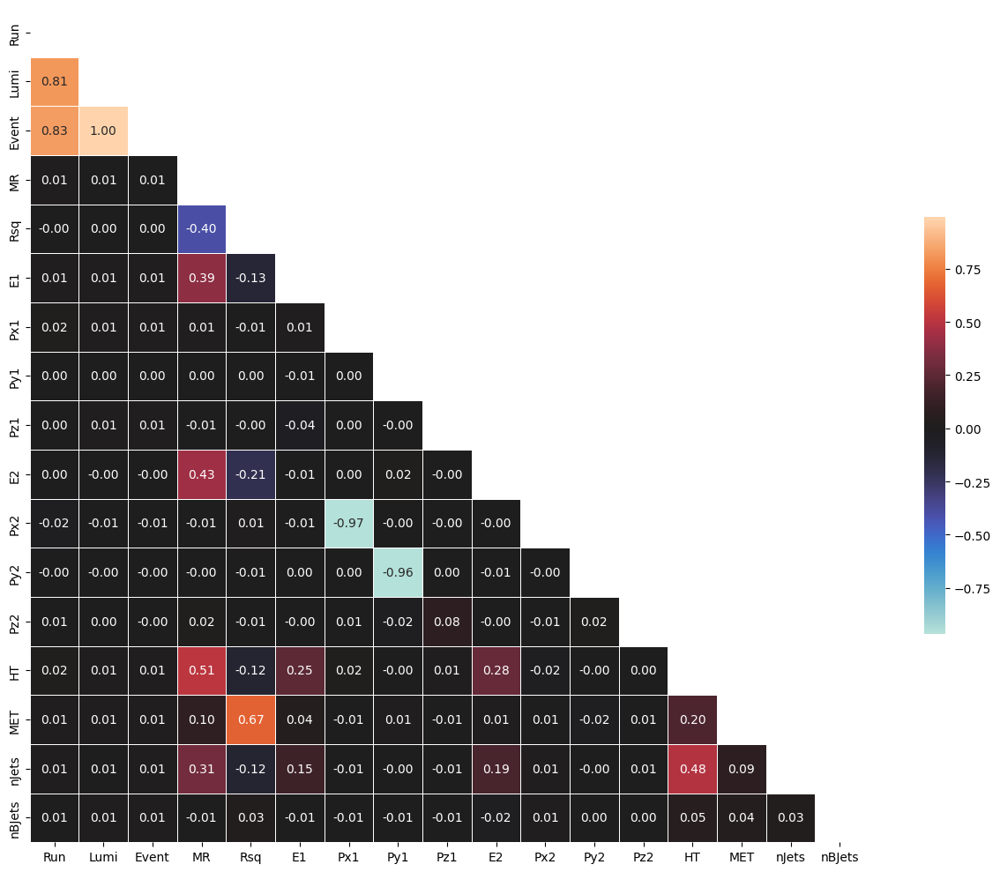

In [ ]:
# Assuming the dataset has been loaded into the 'data' DataFrame, we can create a correlation matrix heatmap.
# This code snippet will plot a correlation matrix for the numerical features in the DataFrame.

# Load the dataset


# Calculate the correlation matrix
corr_matrix = data.corr()

# Create a mask to display only the lower triangle of the matrix, as it is symmetric
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(14, 10))

# Draw the heatmap with the mask
sns.heatmap(corr_matrix, mask=mask, center=0, annot=True, fmt='.2f', square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Adjust the layout
plt.tight_layout()
plt.show()


Run and Lumi: These are typically identifiers and should not have physical correlations with other variables. Any non-zero values could be due to specific runs or luminosity blocks having particular conditions or events.

Event and MR: If there's a correlation, it could be coincidental as "Event" is usually an identifier, while "MR" is a physical measurement.

Rsq and MET: A strong positive correlation is expected because both are related to energy balance in transverse plane. A high Rsq often means a significant imbalance, which could be due to particles leaving the detector unnoticed, contributing to MET.

E1 and Px1, Py1, Pz1 (and similarly E2 with Px2, Py2, Pz2): The energy of a jet (E1, E2) is related to its momentum components. A correlation reflects the relationship between the energy and momentum of a particle, as dictated by relativistic physics.

Px2 and Py2: A strong negative correlation suggests that these two components of momentum are related in such a way that when one increases, the other decreases, possibly indicating a preferred direction or conservation of momentum in the plane orthogonal to the beam.

HT and MET: HT is the scalar sum of the transverse momentum of jets, and MET is the missing transverse energy. A correlation between them could suggest events with high HT are more likely to have significant MET, possibly due to neutrinos or other non-detected particles carrying away energy.

nJets and nBJets: If these are correlated, it might indicate that events with more jets also tend to have more b-tagged jets, which could reflect the nature of the physical processes producing the jets, such as the decay of heavy particles that result in multiple b-quarks.

NameError: name 'dtree' is not defined

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression


# Define the target variable and features
# Assuming the target variable is 'nBJets' and the rest are features
X = data.drop('nBJets', axis=1)
y = data['nBJets']

# Initialize the machine learning models
rf = RandomForestClassifier(n_estimators=100, random_state=42)
logreg = LogisticRegression(max_iter=1000)

# Fit the Random Forest model
rf.fit(X, y)

# Fit the Logistic Regression model
logreg.fit(X, y)

# Get feature importances from Random Forest
feature_importance_rf = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)

# Get coefficients from Logistic Regression
# For logistic regression, we are interested in the absolute values of the coefficients
feature_importance_logreg = pd.Series(abs(logreg.coef_[0]), index=X.columns).sort_values(ascending=False)

# Combine the feature importance from both models into a single DataFrame for comparison
feature_importances = pd.DataFrame({
    'Random_Forest': feature_importance_rf,
    'Logistic_Regression': feature_importance_logreg
})

# Display the feature importances
print(feature_importances)


       Random_Forest  Logistic_Regression
E1          0.071342         4.203391e-08
E2          0.072705         4.129462e-08
Event       0.069664         1.170253e-10
HT          0.076389         3.065313e-08
Lumi        0.036579         6.389523e-09
MET         0.075133         1.868834e-09
MR          0.072170         4.889985e-08
Px1         0.073700         5.850795e-10
Px2         0.074918         3.857230e-10
Py1         0.072672         4.581393e-10
Py2         0.070293         2.152340e-10
Pz1         0.069502         3.172846e-10
Pz2         0.070913         8.386272e-10
Rsq         0.071398         2.746686e-12
Run         0.008912         2.033249e-05
nJets       0.013710         3.196355e-10
